In [1]:
import numpy as np
import pandas as pd 
import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx
from descartes import PolygonPatch
from shapely.geometry import Point, Polygon, MultiPolygon, LineString
from tqdm.auto import tqdm
import shapely.speedups
shapely.speedups.enable() 
import warnings
warnings.filterwarnings('ignore')

/home/akansh-i2sc/anaconda3/envs/hiwi/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_25098/2778500982.py:11: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()


In [2]:
PLACE_NAME = 'Frankfurt, Hesse, Germany'
name = 'Frankfurt'
grid_size = 500

epsg:4326
+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs
<class 'shapely.geometry.polygon.Polygon'>


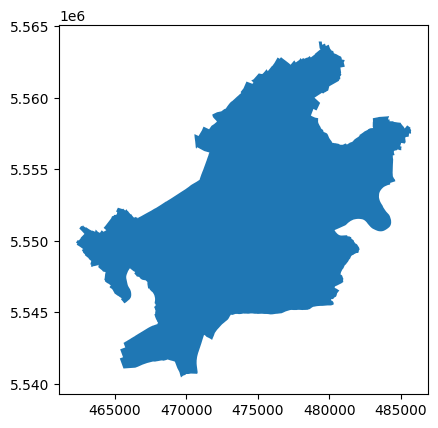

In [3]:
city = ox.geocode_to_gdf(PLACE_NAME)
print(city.crs)
## changing CRS for grid division
city = ox.project_gdf(city) 
print(city.crs)
ax = city.plot()
geometry = city['geometry'].iloc[0]
print(type(geometry))

In [4]:
#save geometry
city.to_file(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}.shp")

#### Division into grid

In [5]:
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width=grid_size) #500 Meter grid
print(type(geometry_cut))
polylist = [poly for poly in geometry_cut.geoms]

<class 'shapely.geometry.multipolygon.MultiPolygon'>


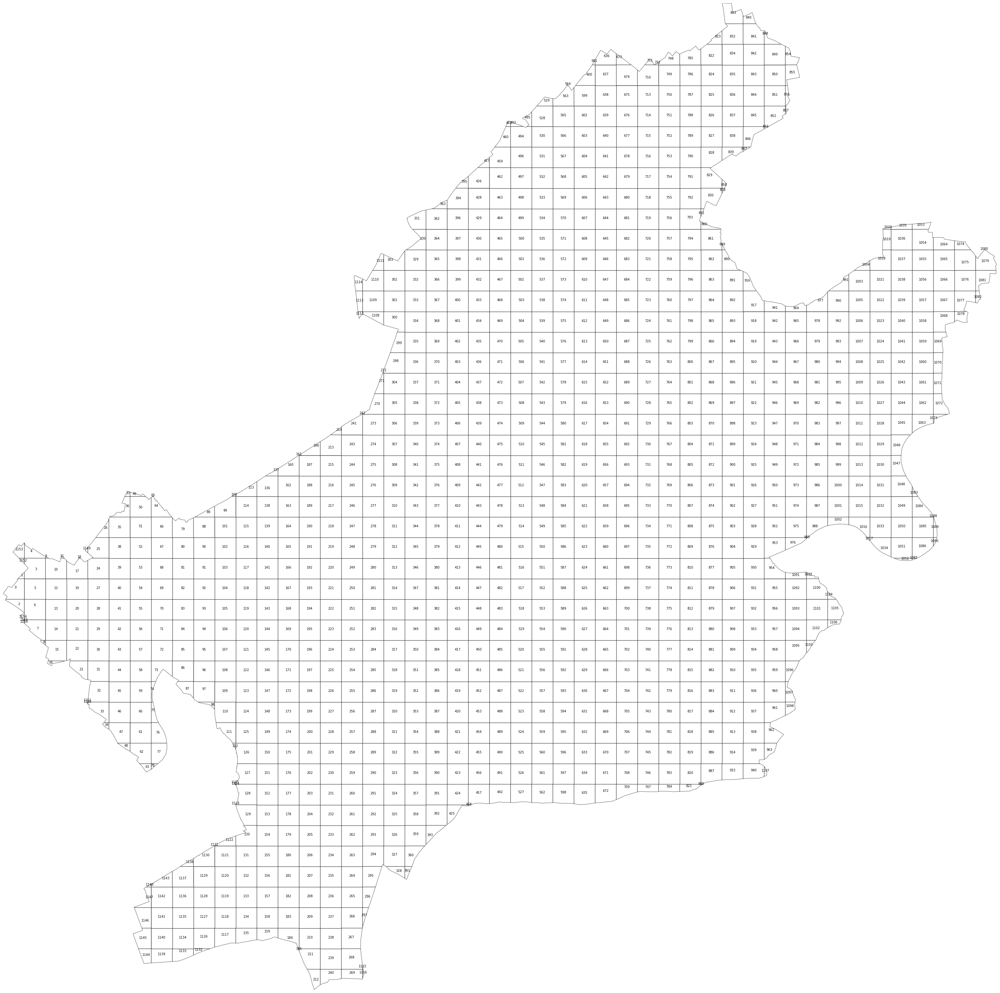

In [6]:
polylist = [poly for poly in geometry_cut.geoms]
# plot city
west, south, east, north = city.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut.geoms, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=7)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [7]:
city_polyframe = gpd.GeoDataFrame(geometry=polylist)
city_polyframe.crs = city.crs
print(city_polyframe.crs)
city_polyframe.head()

+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((462292.676 5549862.620, 462316.774 5..."
1,"POLYGON ((462639.349 5550216.518, 462747.780 5..."
2,"POLYGON ((462791.693 5549726.881, 462791.693 5..."
3,"POLYGON ((462791.693 5550371.764, 462883.004 5..."
4,"POLYGON ((462791.693 5550706.156, 462791.693 5..."


(6448935.11750589, 6485706.226088024)

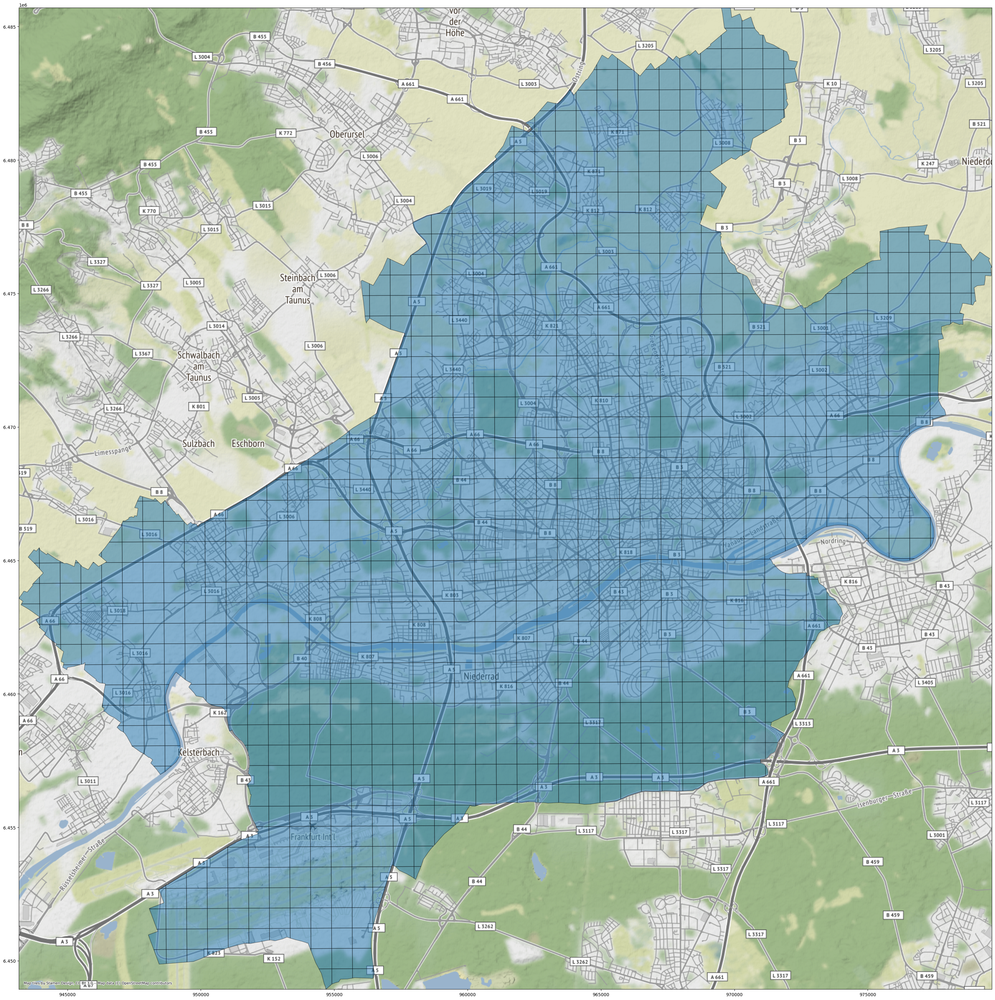

In [8]:
import contextily as ctx
# ctx uses epsg:3857ax = city.plot()
polyframe_3857 = city_polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)

#### POIs
- Understanding each one of them and making dataset

In [9]:
city_polyframe_lat_long = ox.project_gdf(city_polyframe, to_latlong=True) #Changing CRS to (Lat, long)
city_polyframe_lat_long.head()

,geometry
0,"POLYGON ((8.47276 50.09982, 8.47309 50.10013, ..."
1,"POLYGON ((8.47757 50.10303, 8.47908 50.10403, ..."
2,"POLYGON ((8.47975 50.09863, 8.47978 50.09577, ..."
3,"POLYGON ((8.47969 50.10443, 8.48096 50.10528, ..."
4,"POLYGON ((8.47966 50.10744, 8.47962 50.11074, ..."


##### 1. EV stations

In [10]:
EV_stations = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "charging_station"},
)
EV_stations.head()
EV_stations.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-EV_stations.csv")

Text(0.5, 1.0, 'Frankfurt, Hesse, Germany EV stations')

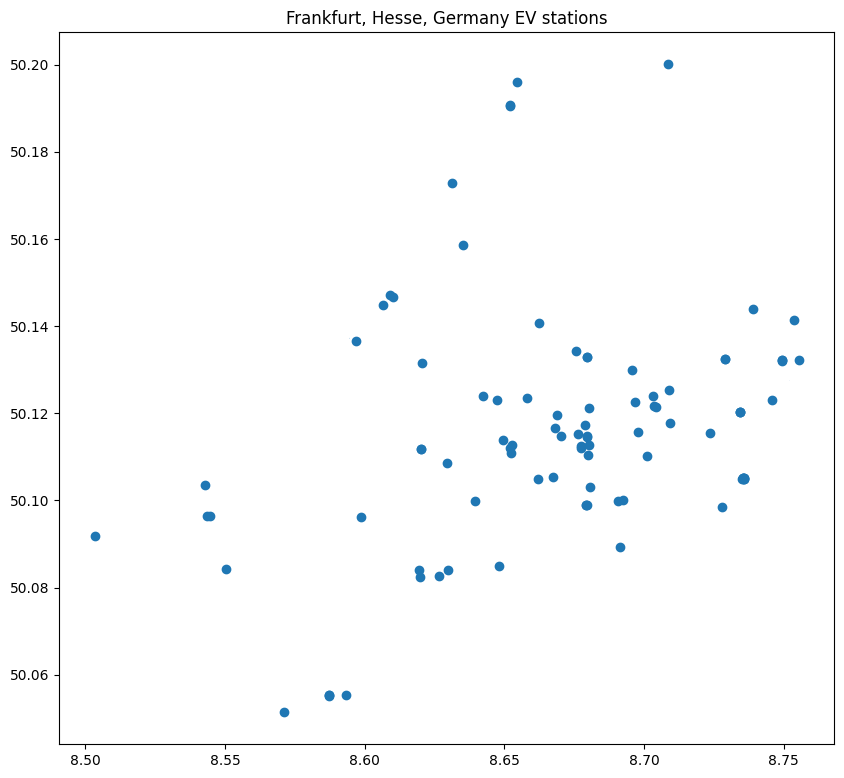

In [15]:
#plot EV stations geo data
EV_stations.plot(figsize=(10,10))
plt.title(f"{PLACE_NAME} EV stations")

Text(0.5, 1.0, 'Frankfurt, Hesse, Germany EV stations')

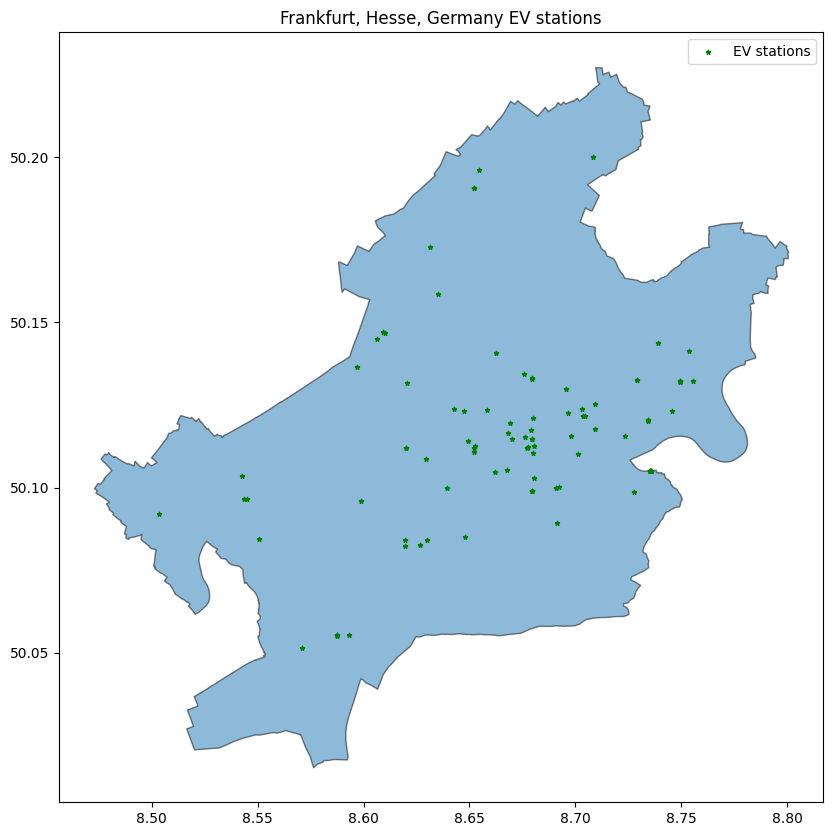

In [16]:
fig, ax = plt.subplots(figsize=(10,10))
ox.project_gdf(city, to_latlong=True).plot(ax =ax, alpha=0.5, edgecolor='k')
EV_stations.plot(ax=ax, color='green', marker='*', markersize=10)
#add legend
plt.legend(['EV stations'])
plt.title(f"{PLACE_NAME} EV stations")

In [17]:
list(EV_stations.columns)

['access',
 'amenity',
 'amperage',
 'authentication:none',
 'capacity',
 'description',
 'motorcar',
 'opening_hours',
 'operator',
 'operator:wikidata',
 'operator:wikipedia',
 'socket:type2',
 'socket:type2:output',
 'voltage',
 'geometry',
 'bicycle',
 'bus',
 'hgv',
 'ref',
 'rwetempcharging_station:plug',
 'scooter',
 'socket:type1_cable',
 'socket:type1_cable:current',
 'socket:type1_cable:output',
 'socket:type1_cable:voltage',
 'socket:type2_cable',
 'socket:type2_cable:output',
 'socket:type2_cable:voltage',
 'source',
 'source:delivery_date',
 'brand',
 'brand:wikidata',
 'brand:wikipedia',
 'name',
 'addr:city',
 'addr:country',
 'addr:postcode',
 'addr:street',
 'fixme',
 'addr:housenumber',
 'socket:type1',
 'socket:type1:current',
 'socket:type1:output',
 'socket:type1:voltage',
 'socket:type1_combo',
 'socket:type1_combo:current',
 'socket:type1_combo:voltage',
 'fee',
 'maxstay',
 'parking:fee',
 'payment:app',
 'payment:cards',
 'payment:cash',
 'payment:membership_ca

In [18]:
assert np.sum(EV_stations['amenity'].values == 'charging_station') ==  len(EV_stations) #amenity column
### investigating important columns
EV_stations['geometry'].head() #geometry column

element_type  osmid     
node          269378130     POINT (8.59870 50.09607)
              938889072     POINT (8.69770 50.11558)
              1049677515    POINT (8.65280 50.11269)
              1199272149    POINT (8.65819 50.12353)
              1271420942    POINT (8.65215 50.11201)
Name: geometry, dtype: geometry

In [20]:
#check null values out of toital values
print(EV_stations['amperage'].isnull().sum() / len(EV_stations)) #amperage column
print(EV_stations['voltage'].isnull().sum() / len(EV_stations)) #voltage column
print(EV_stations['capacity'].isnull().sum() / len(EV_stations)) #capacity column
print(EV_stations['socket:type2'].isnull().sum() / len(EV_stations)) #socket column
#output column
# print(EV_stations['output'].isnull().sum() / len(EV_stations)) #output column
#parking column
# print(EV_stations['parking'].isnull().sum() / len(EV_stations)) #parking column
#charging_station:output column

0.8762886597938144
0.8762886597938144
0.15463917525773196
0.8762886597938144


In [21]:
#intersection of points and polygons
import shapely.speedups
shapely.speedups.enable() 

masks_EV = []
for i in tqdm(range(0,city_polyframe.shape[0])):
    pip_mask = EV_stations.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_EV.append(pip_mask)

/tmp/ipykernel_25098/3985573752.py:3: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()
100%|██████████| 1157/1157 [00:00<00:00, 27404.15it/s]


In [22]:
#extract ['amperage', 'voltage', 'amenity', 'capacity'] columns
# EV_stations[masks_EV[1438]][['amperage', 'voltage', 'amenity', 'capacity', 'geometry']]

In [23]:
#EV stations in the 3022 grid (example)
# EV_stations[masks_EV[3022]][['amperage', 'voltage', 'amenity', 'capacity', 'geometry']]

In [24]:
# create a new geodataframe with mask EV stations 
EV_stations_masked = gpd.GeoDataFrame()
for i in tqdm(range(0,city_polyframe.shape[0])):
    EV_stations_masked = pd.concat([EV_stations_masked, EV_stations[masks_EV[i]][['geometry']]], ignore_index=True)

100%|██████████| 1157/1157 [00:01<00:00, 581.64it/s]


In [26]:
# EV_stations[masks_EV[1438]]['amperage'].values.tolist()

In [27]:
berlin_polyframe_lat_long_new = city_polyframe_lat_long.copy()
berlin_polyframe_lat_long_new['EV_stations_counts'] = 0
# berlin_polyframe_lat_long_new['EV_stations_aperage'] = 0
# berlin_polyframe_lat_long_new['EV_stations_voltage'] = 0
# berlin_polyframe_lat_long_new['EV_stations_capacity'] = 0
berlin_polyframe_lat_long_new['EV_stations_geomery'] = 0

In [28]:
for i in tqdm(range(0,berlin_polyframe_lat_long_new.shape[0])):
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_counts'] = EV_stations[masks_EV[i]].shape[0]
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_aperage'] = str(EV_stations[masks_EV[i]][['amperage']].values.tolist())
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_voltage'] = str(EV_stations[masks_EV[i]][['voltage']].values.tolist())
    # berlin_polyframe_lat_long_new.loc[i, 'EV_stations_capacity'] = str(EV_stations[masks_EV[i]][['capacity']].values.tolist())
    berlin_polyframe_lat_long_new.loc[i, 'EV_stations_geomery'] = str(EV_stations[masks_EV[i]][['geometry']].values.tolist())

100%|██████████| 1157/1157 [00:02<00:00, 555.23it/s]


In [29]:
#How many EV stations in each grid
berlin_polyframe_lat_long_new['EV_stations_counts'].value_counts()
#Percentage of EV stations in each grid
berlin_polyframe_lat_long_new['EV_stations_counts'].value_counts() / berlin_polyframe_lat_long_new.shape[0]

EV_stations_counts
0    0.949870
1    0.031979
2    0.009507
3    0.006050
4    0.001729
9    0.000864
Name: count, dtype: float64

##### Population data visualize and add to each grid

In [30]:
#### Extract population data
df_pop = pd.read_csv("//home/akansh-i2sc/Downloads/Compressed/population_deu_2019-07-01.csv")
gdf = gpd.GeoDataFrame(df_pop, geometry=gpd.points_from_xy(df_pop.Lon, df_pop.Lat))

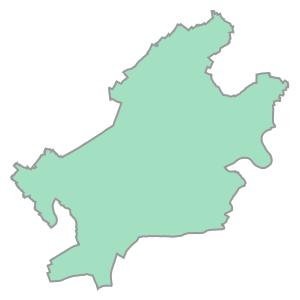

In [31]:
#extract population data for berlin
city.geometry[0]

In [32]:
# change crs to lat long
city_lat_long = ox.project_gdf(city, to_latlong=True)
pip_mask = gdf.within(city_lat_long.loc[0, 'geometry']) 

In [33]:
berlin_pop_gdf = gdf.loc[pip_mask]

<Axes: >

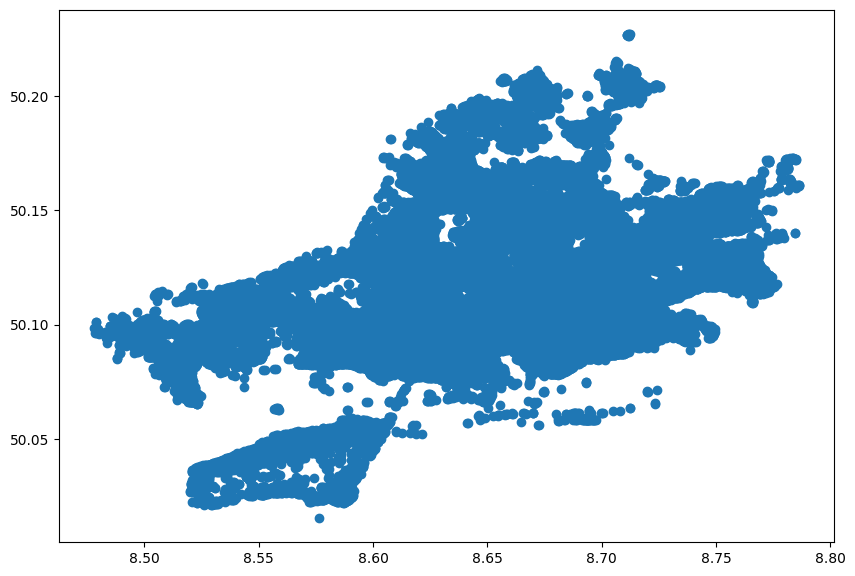

In [34]:
#plot population data with cmap
berlin_pop_gdf.plot(figsize=(10,10))

In [35]:
berlin_pop_gdf.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-population.csv")

In [36]:
# population for each grid
masks_pop = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = berlin_pop_gdf.within(city_polyframe_lat_long.loc[i, 'geometry'])
    masks_pop.append(pip_mask)

100%|██████████| 1157/1157 [00:01<00:00, 789.47it/s]


In [37]:
pop_grid = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    pop_grid.append(berlin_pop_gdf.loc[masks_pop[i]].Population.mean())

In [38]:
pop_grid = np.nan_to_num(pop_grid)

In [39]:
berlin_polyframe_lat_long_new['population'] = pop_grid
berlin_polyframe_lat_long_new.head()

,geometry,EV_stations_counts,EV_stations_geomery,population
0,"POLYGON ((8.47276 50.09982, 8.47309 50.10013, ...",0,[],9.014051
1,"POLYGON ((8.47757 50.10303, 8.47908 50.10403, ...",0,[],0.000000
2,"POLYGON ((8.47975 50.09863, 8.47978 50.09577, ...",0,[],9.014051
3,"POLYGON ((8.47969 50.10443, 8.48096 50.10528, ...",0,[],9.014051
4,"POLYGON ((8.47966 50.10744, 8.47962 50.11074, ...",0,[],0.000000


/tmp/ipykernel_25098/793193480.py:9: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(['EV stations'])


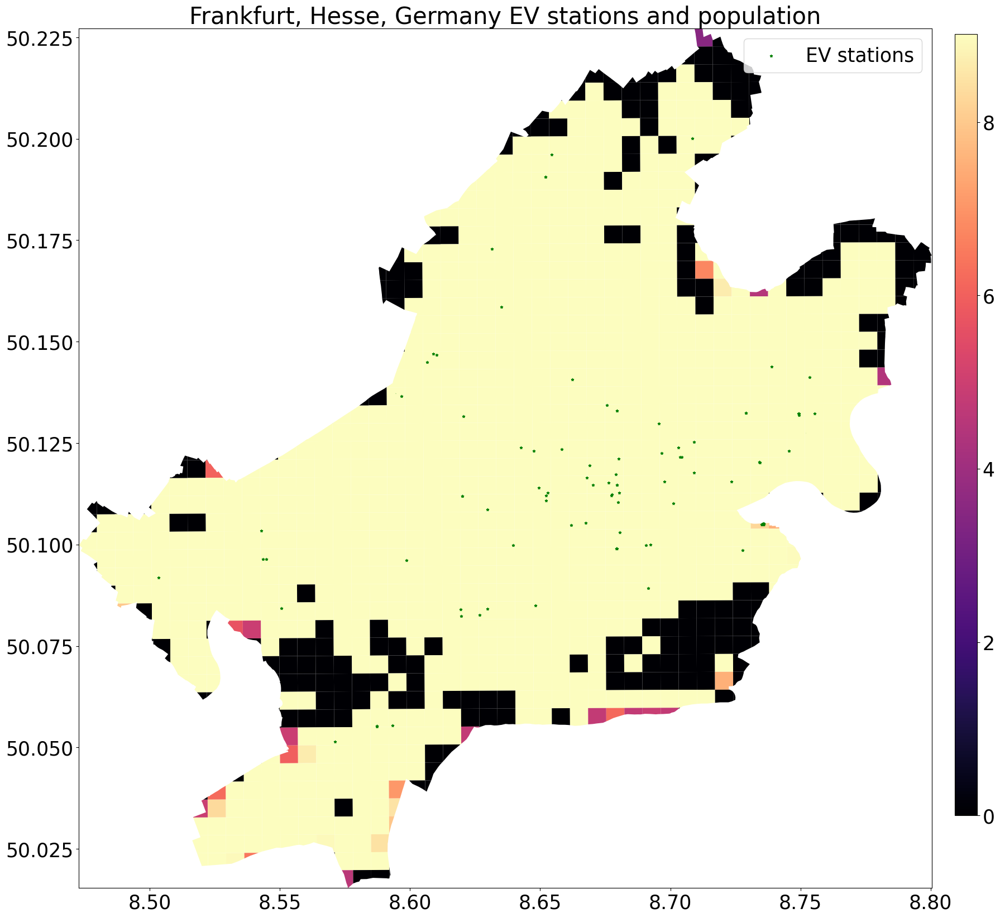

In [40]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'population', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} EV stations and population')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(berlin_polyframe_lat_long_new.population), vmax=max(berlin_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### LAnd_USE 

In [41]:
landuse = ox.geometries_from_place(PLACE_NAME, tags={'landuse': True})

# Define the categories
categories = {
    'residential': ['residential'],
    'commercial': ['commercial', 'retail', 'office', 'industrial'],
    'retail': ['retail'],
    'industrial': ['industrial']
}

# Create a new column to categorize the landuse types
landuse['category'] = 'Other'

# Iterate through the categories and assign the corresponding landuse types
for category, tags in categories.items():
    landuse.loc[landuse['landuse'].isin(tags), 'category'] = category

In [42]:
landuse.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-landuse.csv")

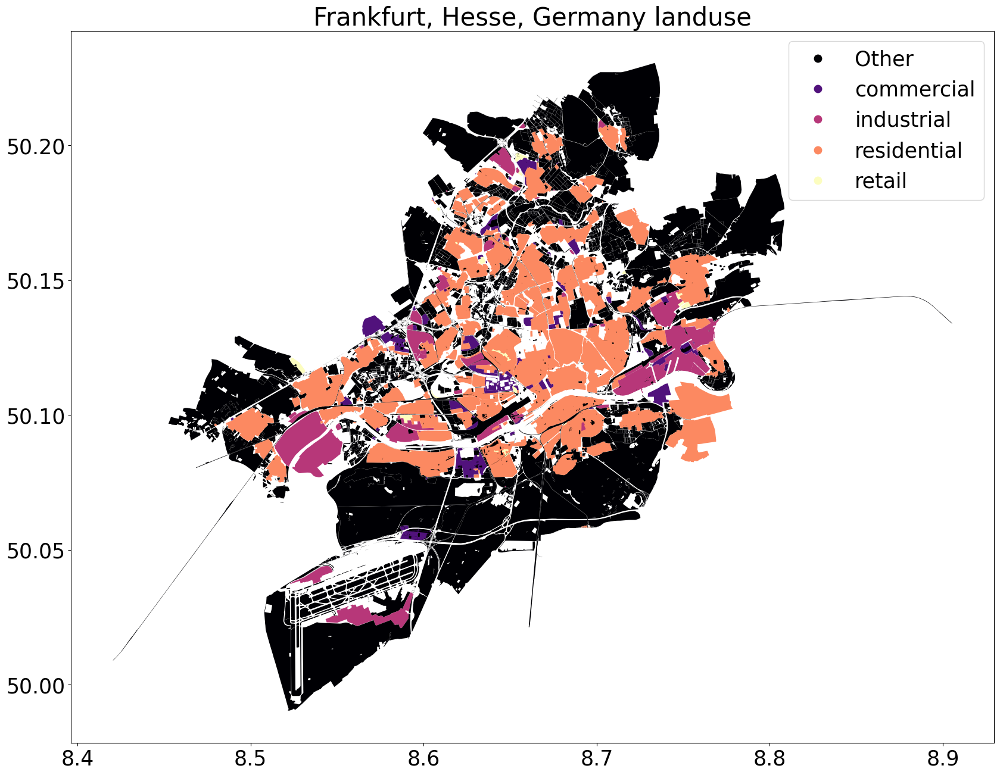

In [43]:
#plot node in landuse
fig, ax = plt.subplots(figsize=(20,20))
landuse.plot(ax=ax, column = 'category', legend=True, cmap='magma')
plt.title(f'{PLACE_NAME} landuse')
plt.show()

In [44]:
#create a copy of landuse drop everything except Category and geometry
landuse_cat = landuse[['category', 'geometry']].copy()

In [45]:
import shapely.speedups
shapely.speedups.enable()

/tmp/ipykernel_25098/3808896212.py:2: DeprecationWarning: This function has no longer any effect, and will be removed in a future release. Starting with Shapely 2.0, equivalent speedups are always available
  shapely.speedups.enable()


In [46]:
masks_land_use = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = landuse_cat.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_land_use.append(pip_mask)
    assert pip_mask.shape[0] == landuse_cat.shape[0]

100%|██████████| 1157/1157 [00:00<00:00, 7276.45it/s]


In [47]:
land_labels = []
for i in range(0,city_polyframe_lat_long.shape[0]):
    if landuse_cat[masks_land_use[i]].category.value_counts().isnull().all() == True:
        land_labels.append('Other')
    else:
        land_labels.append(landuse_cat[masks_land_use[i]].category.value_counts().index[0])

In [48]:
berlin_polyframe_lat_long_new['landuse'] = land_labels

In [49]:
berlin_polyframe_lat_long_new.landuse.value_counts()

landuse
Other          1128
industrial       11
commercial        9
residential       6
retail            3
Name: count, dtype: int64

/tmp/ipykernel_25098/2740752356.py:8: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


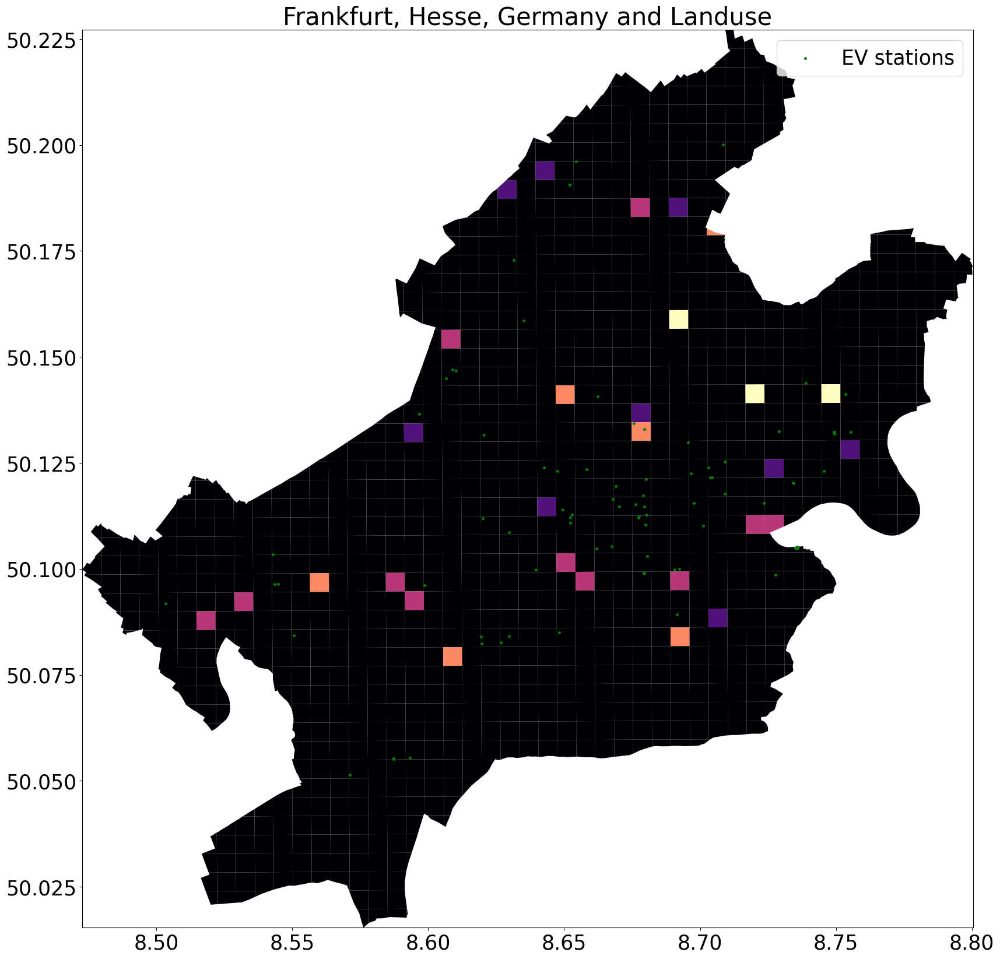

In [50]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'landuse', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
ax.legend()
# add legend
plt.title(f'{PLACE_NAME} and Landuse')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### Raod Connectivity

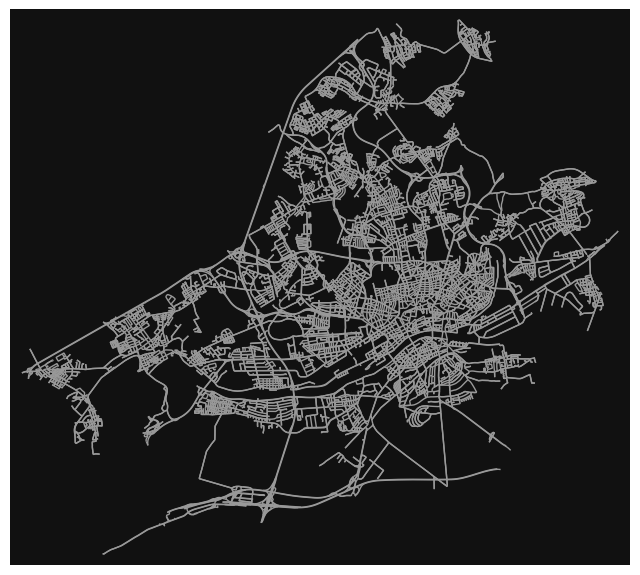

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [51]:
G = ox.graph_from_place(PLACE_NAME, network_type='drive')
ox.plot_graph(G, node_size= 0)

In [48]:
area,edges = ox.graph_to_gdfs(G)

In [52]:
# poly = city_polyframe_lat_long.loc[1254, 'geometry']
# G_1 = ox.graph_from_polygon(poly, network_type='drive')
# ox.plot_graph(G_1)

# #print number of nodes and edges and density
# print('Number of nodes in the graph: ', len(list(G_1.nodes())))
# print('Number of edges in the graph: ', len(list(G_1.edges())))
# print('Density of the graph: ', nx.density(G_1))

In [53]:
#calculate number of edges and nodes for each grid
nodes = []
edges = []
density = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    try: 
        poly = city_polyframe_lat_long.loc[i, 'geometry']
        G = ox.graph_from_polygon(poly, network_type='drive')
        nodes.append(len(list(G.nodes())))
        edges.append(len(list(G.edges())))
        density.append(nx.density(G))
    except:
        nodes.append(0)
        edges.append(0)
        density.append(0)


100%|██████████| 1157/1157 [10:25<00:00,  1.85it/s]


In [54]:
#add nodes, edges and density to the dataframe
berlin_polyframe_lat_long_new['nodes'] = nodes
berlin_polyframe_lat_long_new['edges'] = edges
berlin_polyframe_lat_long_new['density'] = density

In [55]:
#relation between EV stations and nodes


/tmp/ipykernel_25098/3231466269.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


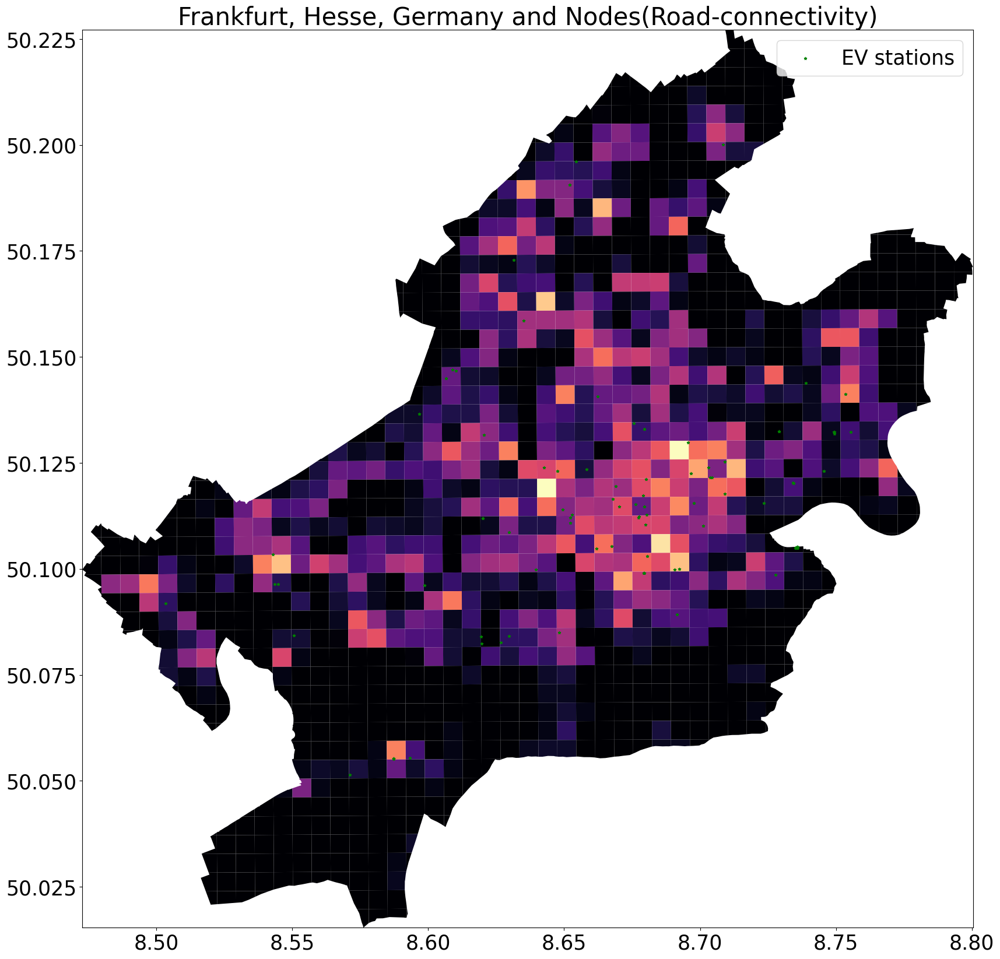

In [56]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'nodes', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Nodes(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

/tmp/ipykernel_25098/2103950948.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


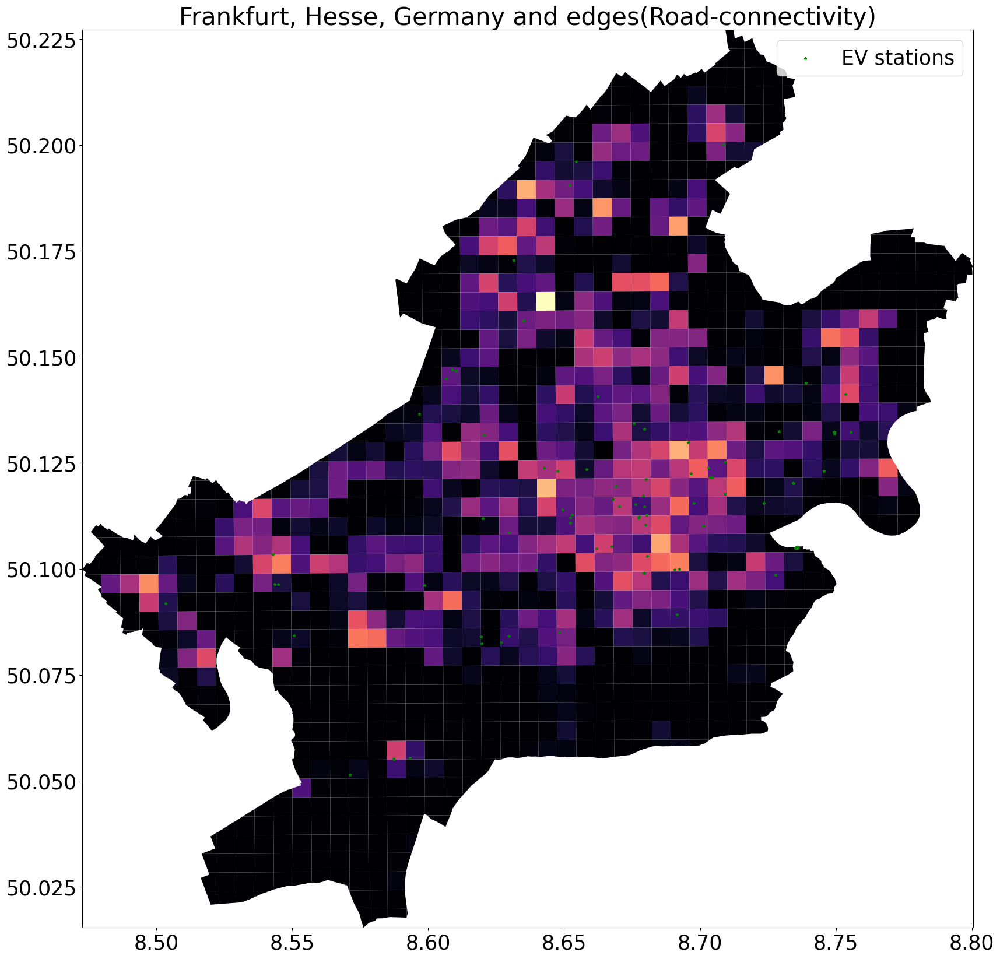

In [57]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'edges', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and edges(Road-connectivity)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

/tmp/ipykernel_25098/3099643536.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


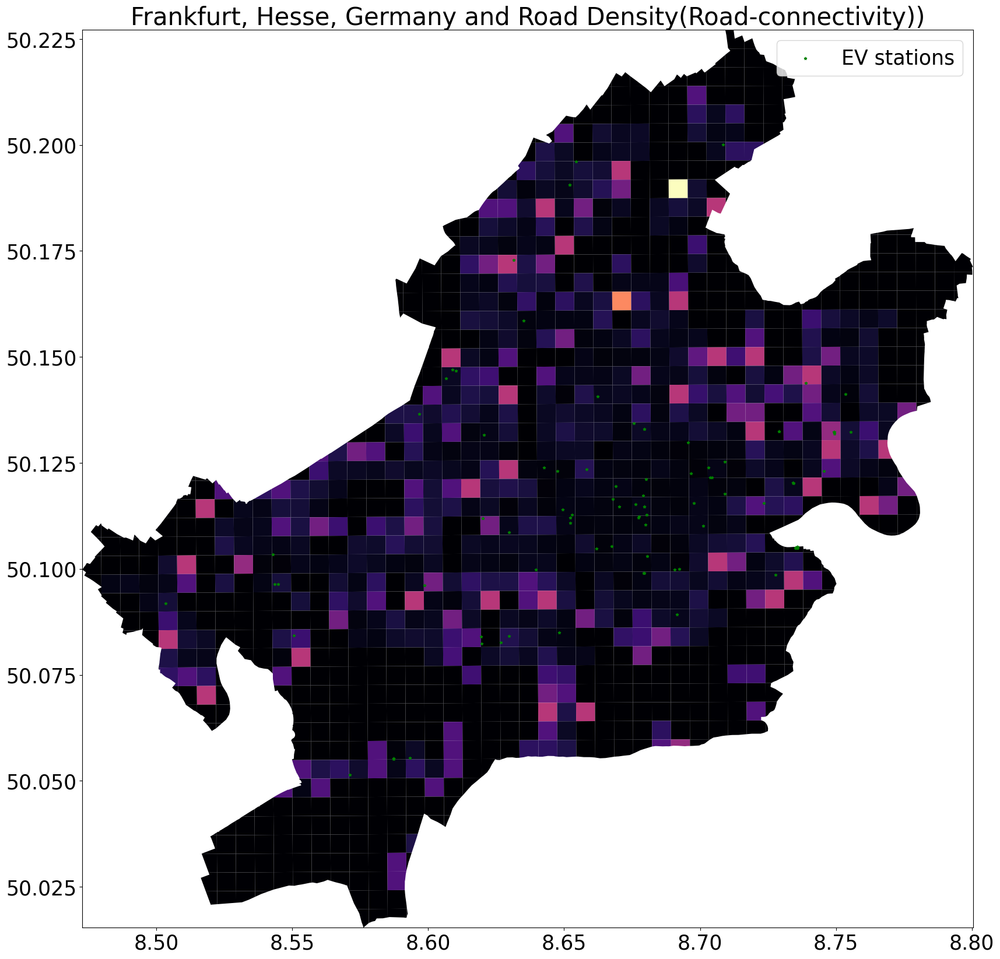

In [58]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

#nodes
fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'density', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road Density(Road-connectivity))')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

##### Parking

In [59]:
parking = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "parking"},
)
parking.head()
parking.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-parking.csv")

<Axes: >

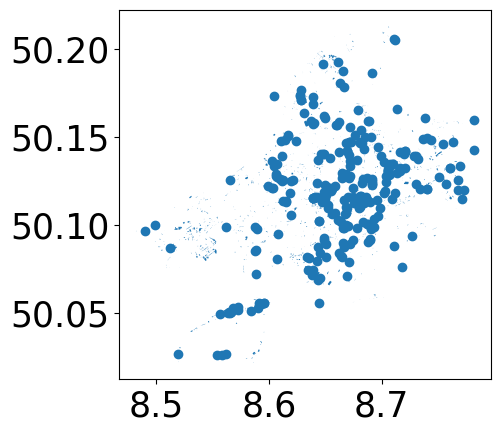

In [60]:
#parking spaces in the city
parking.plot()

In [61]:
#find parking spaces counts in the grid and their types
masks_parking = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = parking.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_parking.append(pip_mask)

100%|██████████| 1157/1157 [00:00<00:00, 15932.27it/s]


In [62]:
parking[masks_parking[1032]].shape[0]

0

In [63]:
#parking space counts and types to the dataframe
parking_count = []
parking_types = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    parking_count.append(parking[masks_parking[i]].shape[0])
    parking_types.append(parking[masks_parking[i]].parking.value_counts().to_dict())

100%|██████████| 1157/1157 [00:01<00:00, 742.99it/s]


In [64]:
berlin_polyframe_lat_long_new['parking_count'] = parking_count
berlin_polyframe_lat_long_new['parking_types'] = parking_types

/tmp/ipykernel_25098/874256832.py:12: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


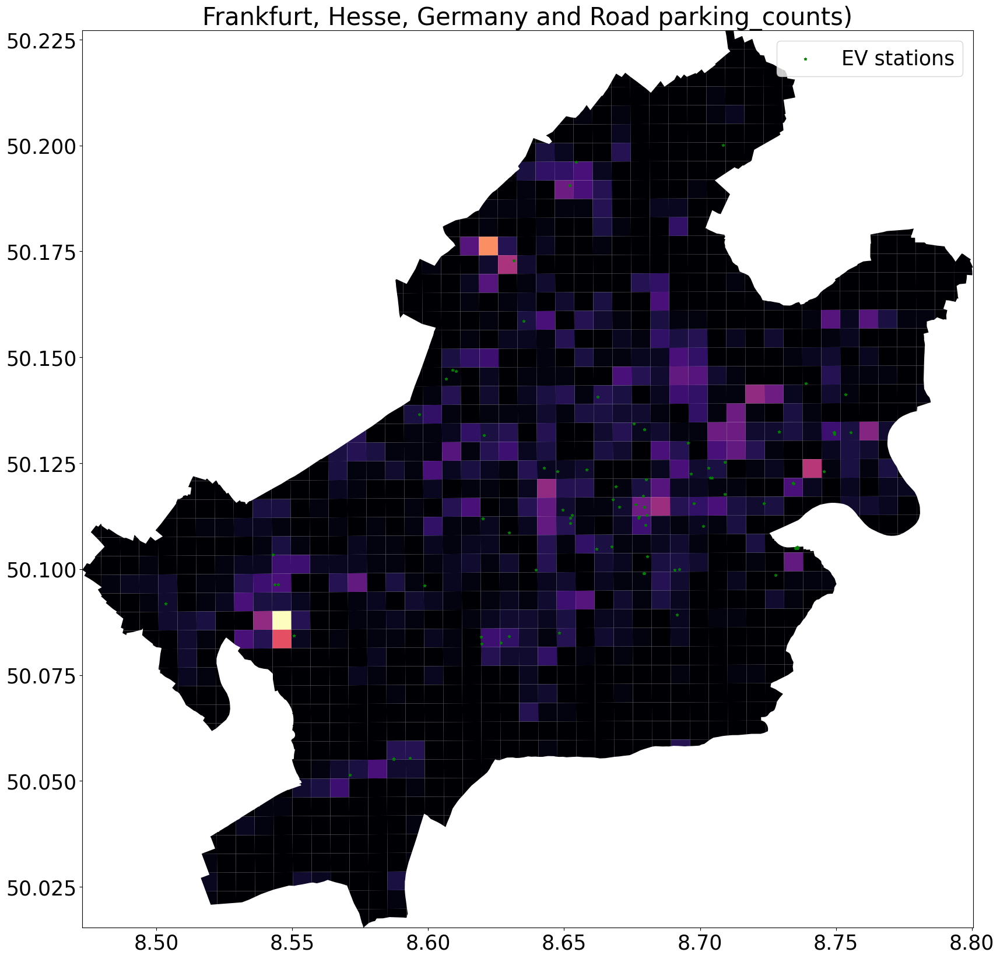

In [65]:
#relation between EV stations and parking spaces

plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'parking_count', legend=False, cmap='magma')

# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')

ax.legend()
plt.title(f'{PLACE_NAME} and Road parking_counts)')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.show()

In [66]:
#realation between EV stations and parking types
berlin_polyframe_lat_long_new[berlin_polyframe_lat_long_new['EV_stations_counts'] != 0].parking_types.value_counts()

#TO DO: PlOT the parking types with EV stations


parking_types
{}                                                                                  10
{'surface': 3}                                                                       5
{'surface': 1}                                                                       5
{'surface': 2}                                                                       3
{'multi-storey': 1}                                                                  2
{'surface': 3, 'multi-storey': 1}                                                    2
{'surface': 2, 'underground': 1}                                                     2
{'surface': 2, 'multi-storey': 1}                                                    2
{'underground': 4, 'multi-storey': 1}                                                1
{'surface': 3, 'street_side': 2, 'multi-storey': 1}                                  1
{'surface': 4, 'multi-storey': 1}                                                    1
{'underground': 1}           

##### Resturants

In [67]:
restaurant = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "restaurant"},
)
restaurant.head()
restaurant.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-restaurant.csv")

<Axes: >

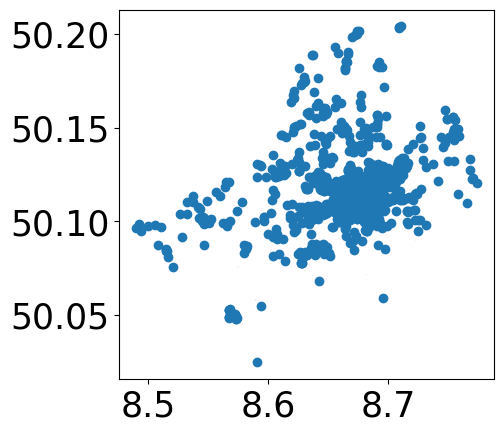

In [68]:
restaurant.plot()

In [69]:
list(restaurant.columns)

['addr:city',
 'addr:housenumber',
 'addr:postcode',
 'addr:street',
 'amenity',
 'cuisine',
 'diet:kosher',
 'name',
 'phone',
 'website',
 'wheelchair',
 'geometry',
 'microbrewery',
 'addr:country',
 'addr:suburb',
 'contact:email',
 'contact:phone',
 'contact:website',
 'opening_hours',
 'source',
 'source:date',
 'wheelchair:description',
 'operator',
 'smoking',
 'toilets:wheelchair',
 'email',
 'fax',
 'indoor_seating',
 'outdoor_seating',
 'website:menu',
 'diet:vegan',
 'diet:vegetarian',
 'check_date:opening_hours',
 'opening_hours:signed',
 'old_name',
 'diet:non-vegetarian',
 'payment:cash',
 'payment:ec',
 'biergarten',
 'contact:fax',
 'gay',
 'level',
 'opening_hours:kitchen',
 'payment:american_express',
 'payment:girocard',
 'payment:visa',
 'reservation',
 'toilets',
 'toilets:access',
 'takeaway',
 'delivery',
 'description',
 'name:ko',
 'capacity',
 'fixme',
 'name:de',
 'old_name:it',
 'removed:cuisine',
 'strapline',
 'internet_access',
 'man_made',
 'contact:mob

In [70]:
#find resturants counts in the grid and their types
masks_restaurant = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = restaurant.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_restaurant.append(pip_mask)



100%|██████████| 1157/1157 [00:00<00:00, 24144.53it/s]


In [71]:
#resturant counts and capacity to the dataframe
restaurant_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    restaurant_count.append(restaurant[masks_restaurant[i]].shape[0])

100%|██████████| 1157/1157 [00:00<00:00, 1457.76it/s]


In [72]:
berlin_polyframe_lat_long_new['restaurant_count'] = restaurant_count

/tmp/ipykernel_25098/3766938667.py:9: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(['EV stations'])


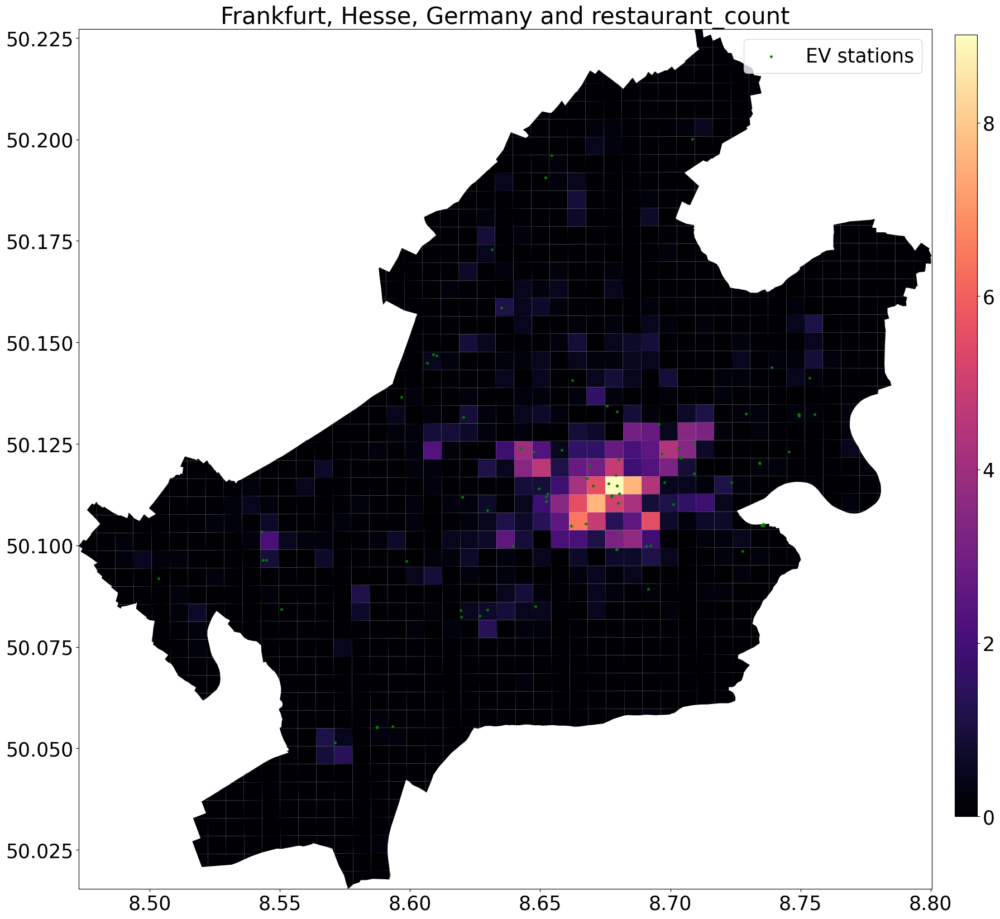

In [73]:
plt.rcParams.update({'font.size':25})
west, south, east, north = berlin_polyframe_lat_long_new.unary_union.bounds

fig, ax = plt.subplots(figsize=(20,20))
berlin_polyframe_lat_long_new.plot(ax=ax, column = 'restaurant_count', legend=False, cmap='magma')
# add EV stations
EV_stations.plot(ax=ax, color='green', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['EV stations'])
plt.title(f'{PLACE_NAME} and restaurant_count')
cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(berlin_polyframe_lat_long_new.population), vmax=max(berlin_polyframe_lat_long_new.population)))
sm._A = []
# draw colormap into cbax
fig.colorbar(sm, cax=cbax, format="%d")
ax.set_xlim(west, east)
ax.set_ylim(south, north)
# ax.axis('off')30
plt.show()

##### library

In [74]:
#relation between EV stations and library
library = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "library"},
)
library.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-library.csv")
library.head()

addr:city addr:housenumber addr:postcode  \
element_type osmid                                                         
node         16084570   Frankfurt am Main                1         60322   
             30764670                 NaN              NaN           NaN   
             245928101                NaN              NaN           NaN   
             292412929                NaN              NaN           NaN   
             294761133  Frankfurt am Main                4         60311   

                         addr:street  amenity                 contact:email  \
element_type osmid                                                            
node         16084570   Adickesallee  library                 info-f@dnb.de   
             30764670            NaN  library  auskunft@ub.uni-frankfurt.de   
             245928101           NaN  library                           NaN   
             292412929           NaN  library                           NaN   
             294761133    Hasengasse  library                           NaN   

                            contact:fax     contact:phone  \
element_type osmid                                          
node         16084570   +49 69 15251010     +49 69 1525-0   
             30764670               NaN  +49 69 798 39205   
             245928101              NaN               NaN   
             292412929              NaN               NaN   
             294761133              NaN               NaN   

                                                                     name  \
element_type osmid                                                          
node         16084570                         Deutsche Nationalbibliothek   
             30764670                              Universitätsbibliothek   
             245928101  Stadtteilbücherei Bornheim / Kinder- und Jugen...   
             292412929                      Stadtteilbibliothek Dornbusch   
             294761133                       Städtische Zentralbibliothek   

                                                            opening_hours  \
element_type osmid                                                          
node         16084570   Mo-Fr 09:00-22:00; Sa 10:00-18:00; Su off; PH ...   
             30764670                                   Mo-Fr 10:00-18:00   
             245928101          Tu-Fr 13:00-19:00; Sa 10:00-14:00; Mo off   
             292412929  Tu,Th 13:00-19:00; We 13:00-17:00; Fr 11:00-17...   
             294761133                  Mo-Fr 10:00-19:00; Sa 11:00-17:00   

                        ... name:en  ref source:wheelchair shop max_age nodes  \
element_type osmid      ...                                                     
node         16084570   ...     NaN  NaN               NaN  NaN     NaN   NaN   
             30764670   ...     NaN  NaN               NaN  NaN     NaN   NaN   
             245928101  ...     NaN  NaN               NaN  NaN     NaN   NaN   
             292412929  ...     NaN  NaN               NaN  NaN     NaN   NaN   
             294761133  ...     NaN  NaN               NaN  NaN     NaN   NaN   

                       building building:levels roof:levels roof:shape  
element_type osmid                                                      
node         16084570       NaN             NaN         NaN        NaN  
             30764670       NaN             NaN         NaN        NaN  
             245928101      NaN             NaN         NaN        NaN  
             292412929      NaN             NaN         NaN        NaN  
             294761133      NaN             NaN         NaN        NaN  

[5 rows x 52 columns]

<Axes: >

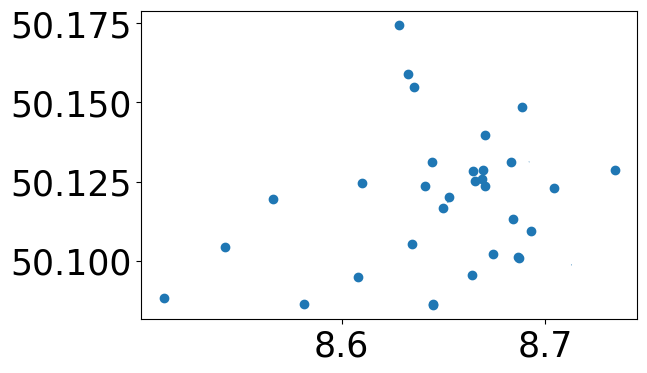

In [75]:
library.plot()

In [76]:
list(library.columns)

['addr:city',
 'addr:housenumber',
 'addr:postcode',
 'addr:street',
 'amenity',
 'contact:email',
 'contact:fax',
 'contact:phone',
 'name',
 'opening_hours',
 'ref:isil',
 'short_name',
 'website',
 'wheelchair',
 'wheelchair:description',
 'wikidata',
 'wikipedia',
 'geometry',
 'contact:website',
 'check_date:opening_hours',
 'phone',
 'toilets:wheelchair',
 'level',
 'alt_name',
 'email',
 'fax',
 'operator',
 'addr:country',
 'internet_access',
 'internet_access:fee',
 'internet_access:operator',
 'internet_access:ssid',
 'source',
 'description',
 'ele',
 'opening_hours:url',
 'alt_name:de',
 'loc_name',
 'loc_name:de',
 'name:de',
 'fixme',
 'indoor',
 'name:en',
 'ref',
 'source:wheelchair',
 'shop',
 'max_age',
 'nodes',
 'building',
 'building:levels',
 'roof:levels',
 'roof:shape']

In [77]:
# find library counts in the grid
masks_library = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = library.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_library.append(pip_mask)

#library counts to the dataframe
library_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    library_count.append(library[masks_library[i]].shape[0])

berlin_polyframe_lat_long_new['library_count'] = library_count

100%|██████████| 1157/1157 [00:00<00:00, 1733.30it/s]


##### University

In [78]:
university = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "university"},
)
university.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-university.csv")
university.head()

geometry          addr:city  \
element_type osmid                                                     
node         604859632   POINT (8.69540 50.10515)  Frankfurt am Main   
             715551481   POINT (8.65649 50.11529)                NaN   
             1812368256  POINT (8.63408 50.17352)  Frankfurt am Main   
             1812369344  POINT (8.63172 50.17263)                NaN   
             2075539482  POINT (8.63222 50.17431)  Frankfurt am Main   

                        addr:country addr:housenumber addr:postcode  \
element_type osmid                                                    
node         604859632            DE               16         60594   
             715551481           NaN              NaN           NaN   
             1812368256          NaN                1         60438   
             1812369344          NaN              NaN           NaN   
             2075539482          NaN                1         60438   

                                        addr:street     amenity  \
element_type osmid                                                
node         604859632   Walther-von-Cronberg-Platz  university   
             715551481                          NaN  university   
             1812368256             Altenhöferallee  university   
             1812369344                         NaN  university   
             2075539482             Altenhöferallee  university   

                                                                      name  \
element_type osmid                                                           
node         604859632   Fernuniversität in Hagen - Regionalzentrum Fra...   
             715551481   Institut für Geschichte der Arabische-Islamisc...   
             1812368256                                  Geowissenschaften   
             1812369344                                Chemische Institute   
             2075539482                                             Physik   

                                                        website wheelchair  \
element_type osmid                                                           
node         604859632   https://www.fernuni-hagen.de/frankfurt        yes   
             715551481                                      NaN         no   
             1812368256                                     NaN        yes   
             1812369344                                     NaN    limited   
             2075539482                                     NaN        yes   

                         ... layer min_height noname roof:colour roof:shape  \
element_type osmid       ...                                                  
node         604859632   ...   NaN        NaN    NaN         NaN        NaN   
             715551481   ...   NaN        NaN    NaN         NaN        NaN   
             1812368256  ...   NaN        NaN    NaN         NaN        NaN   
             1812369344  ...   NaN        NaN    NaN         NaN        NaN   
             2075539482  ...   NaN        NaN    NaN         NaN        NaN   

                        fixme site type operator:type wikimedia_commons  
element_type osmid                                                       
node         604859632    NaN  NaN  NaN           NaN               NaN  
             715551481    NaN  NaN  NaN           NaN               NaN  
             1812368256   NaN  NaN  NaN           NaN               NaN  
             1812369344   NaN  NaN  NaN           NaN               NaN  
             2075539482   NaN  NaN  NaN           NaN               NaN  

[5 rows x 59 columns]

<Axes: >

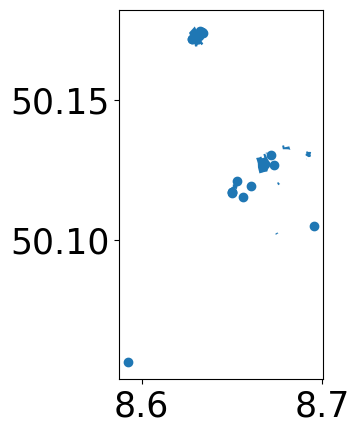

In [79]:
university.plot()

In [80]:
# find university counts in the grid
masks_university = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = university.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_university.append(pip_mask)

#university counts to the dataframe
university_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    university_count.append(university[masks_university[i]].shape[0])

berlin_polyframe_lat_long_new['university_count'] = university_count


100%|██████████| 1157/1157 [00:00<00:00, 1786.53it/s]


##### School

In [81]:
school = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "school"},
)
school.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-school.csv")
school.head()

barrier                  geometry          addr:city  \
element_type osmid                                                            
node         34686315      NaN  POINT (8.76879 50.11969)  Frankfurt am Main   
             35790436      NaN  POINT (8.76824 50.12016)  Frankfurt am Main   
             268918233     NaN  POINT (8.68470 50.11672)                NaN   
             277652034     NaN  POINT (8.69734 50.10982)  Frankfurt am Main   
             573367020     NaN  POINT (8.67480 50.12203)  Frankfurt am Main   

                       addr:housenumber addr:postcode      addr:street  \
element_type osmid                                                       
node         34686315                34         60386   Fachfeldstraße   
             35790436                32         60386   Fachfeldstraße   
             268918233              NaN           NaN              NaN   
             277652034             9-11         60314  Sonnemannstraße   
             573367020              5-7         60322   Gervinusstraße   

                       amenity  \
element_type osmid               
node         34686315   school   
             35790436   school   
             268918233  school   
             277652034  school   
             573367020  school   

                                                          contact:email  \
element_type osmid                                                        
node         34686315                       info@schule-am-mainbogen.de   
             35790436   poststelle.freiligrathschule@stadt-frankfurt.de   
             268918233                                              NaN   
             277652034                           info@erasmus-schule.eu   
             573367020                    info@schule-fuer-touristik.de   

                             contact:fax    contact:phone  ...  alt  \
element_type osmid                                         ...        
node         34686315    +49 69 21249110  +49 69 21248994  ...  NaN   
             35790436    +49 69 21249111  +49 69 21248888  ...  NaN   
             268918233               NaN              NaN  ...  NaN   
             277652034  +49 69 907436412  +49 69 90743640  ...  NaN   
             573367020   +49 69 91501321   +49 69 9150130  ...  NaN   

                       roof:shape capacity  fee image name:fr name:de  \
element_type osmid                                                      
node         34686315         NaN      NaN  NaN   NaN     NaN     NaN   
             35790436         NaN      NaN  NaN   NaN     NaN     NaN   
             268918233        NaN      NaN  NaN   NaN     NaN     NaN   
             277652034        NaN      NaN  NaN   NaN     NaN     NaN   
             573367020        NaN      NaN  NaN   NaN     NaN     NaN   

                       name:etymology ways type  
element_type osmid                               
node         34686315             NaN  NaN  NaN  
             35790436             NaN  NaN  NaN  
             268918233            NaN  NaN  NaN  
             277652034            NaN  NaN  NaN  
             573367020            NaN  NaN  NaN  

[5 rows x 64 columns]

<Axes: >

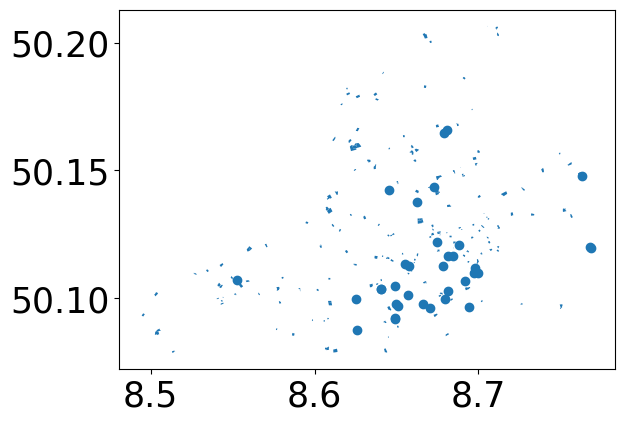

In [82]:
school.plot()

In [83]:
# find school counts in the grid
masks_school = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = school.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_school.append(pip_mask)

#school counts to the dataframe
school_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    school_count.append(school[masks_school[i]].shape[0])

berlin_polyframe_lat_long_new['school_count'] = school_count


100%|██████████| 1157/1157 [00:00<00:00, 1707.69it/s]


##### Leisure = park

In [84]:
park = ox.geometries_from_place(
    PLACE_NAME,
    {"leisure": "park"},
)

park.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-park.csv")
park.head()


highway                  geometry barrier leisure  \
element_type osmid                                                          
node         267237087      NaN  POINT (8.66361 50.12678)     NaN    park   
             293792518      NaN  POINT (8.68596 50.14308)     NaN    park   
             3639247427     NaN  POINT (8.73570 50.12453)     NaN    park   
             5817151681     NaN  POINT (8.64236 50.17758)     NaN    park   
             6427641703     NaN  POINT (8.61647 50.17140)     NaN    park   

                                                            name  \
element_type osmid                                                 
node         267237087                       Koreanischer Garten   
             293792518                                       NaN   
             3639247427            Licht- und Luftbad Riederwald   
             5817151681                                Cozy Bank   
             6427641703  Naturpädagogisches Zentrum Schilasmühle   

                                                                   website  \
element_type osmid                                                           
node         267237087   https://frankfurt.de/themen/umwelt-und-gruen/o...   
             293792518                                                 NaN   
             3639247427                  https://www.liluba-riederwald.de/   
             5817151681                                                NaN   
             6427641703                                                NaN   

                        opening_hours  \
element_type osmid                      
node         267237087            NaN   
             293792518            NaN   
             3639247427           NaN   
             5817151681           NaN   
             6427641703           NaN   

                                                                  operator  \
element_type osmid                                                           
node         267237087                                                 NaN   
             293792518                                                 NaN   
             3639247427  LiLuBa e.V. Verein zur Förderung der Kultur un...   
             5817151681                                                NaN   
             6427641703                                                NaN   

                        access source  ... garden:type wikipedia:de name:en  \
element_type osmid                     ...                                    
node         267237087     NaN    NaN  ...         NaN          NaN     NaN   
             293792518     NaN    NaN  ...         NaN          NaN     NaN   
             3639247427    NaN    NaN  ...         NaN          NaN     NaN   
             5817151681    NaN    NaN  ...         NaN          NaN     NaN   
             6427641703    NaN    NaN  ...         NaN          NaN     NaN   

                        tourism  ref name:etymology note layer ways type  
element_type osmid                                                        
node         267237087      NaN  NaN            NaN  NaN   NaN  NaN  NaN  
             293792518      NaN  NaN            NaN  NaN   NaN  NaN  NaN  
             3639247427     NaN  NaN            NaN  NaN   NaN  NaN  NaN  
             5817151681     NaN  NaN            NaN  NaN   NaN  NaN  NaN  
             6427641703     NaN  NaN            NaN  NaN   NaN  NaN  NaN  

[5 rows x 49 columns]

/tmp/ipykernel_25098/636914825.py:11: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(['park', 'EV stations'])


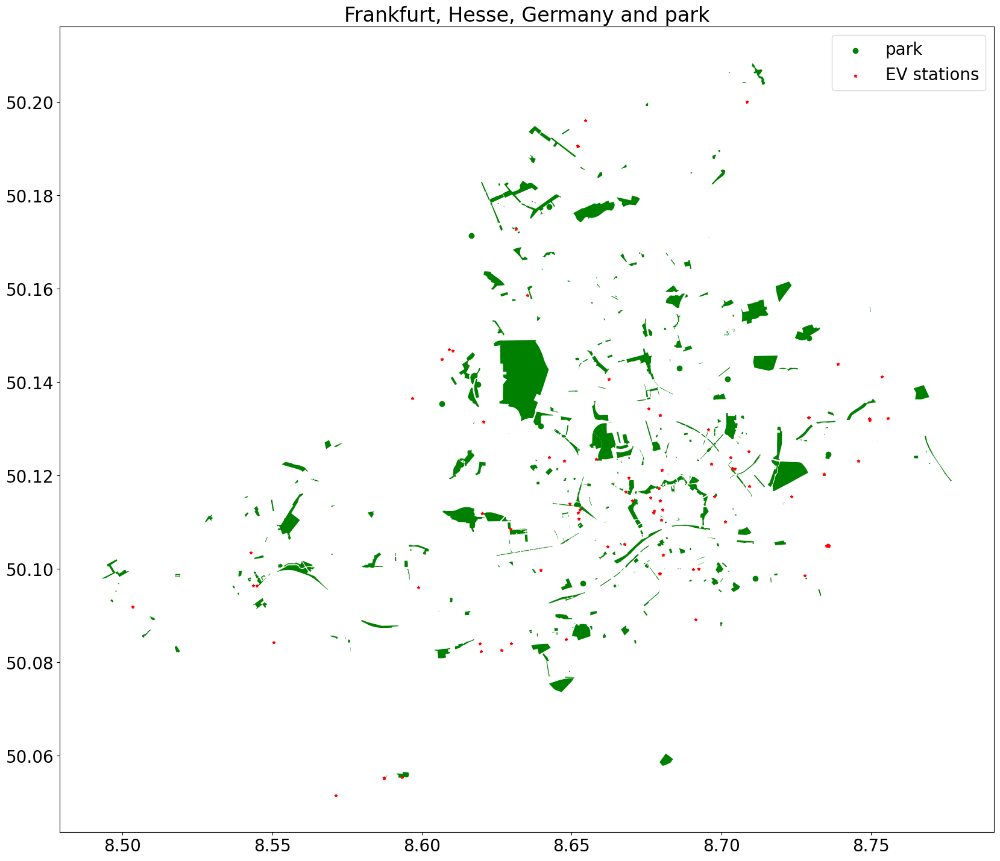

In [85]:
#plot the park data 

plt.rcParams.update({'font.size':20})
fig, ax = plt.subplots(figsize=(20,20))
park.plot(ax=ax, legend=False, color='green')
plt.title(f'{PLACE_NAME} and park')

# add EV stations
EV_stations.plot(ax=ax, color='red', markersize=10, marker='*', label='EV stations')
# add legend
plt.legend(['park', 'EV stations'])

In [86]:
# find park counts in the grid
masks_park = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = park.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_park.append(pip_mask)

#park counts to the dataframe
park_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    park_count.append(park[masks_park[i]].shape[0])

berlin_polyframe_lat_long_new['park_count'] = park_count

100%|██████████| 1157/1157 [00:00<00:00, 1802.49it/s]


##### Leisure = Cinema

In [87]:
cinema = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "cinema"},
)
cinema.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-cinema.csv")
cinema.head()

amenity                 brand brand:wikidata  \
element_type osmid                                                    
node         36140667   cinema              CineStar        Q321889   
             56419112   cinema              CineStar        Q321889   
             56424249   cinema  Cineplex Deutschland            NaN   
             155485401  cinema                   NaN            NaN   
             264151436  cinema                   NaN            NaN   

                       brand:wikipedia                 name  \
element_type osmid                                            
node         36140667      de:Cinestar             CineStar   
             56419112      de:Cinestar  Cinestar Metropolis   
             56424249              NaN              E-Kinos   
             155485401             NaN         Orfeos Erben   
             264151436             NaN             Eldorado   

                       toilets:wheelchair wheelchair  \
element_type osmid                                     
node         36140667                 yes        yes   
             56419112                 yes    limited   
             56424249                 NaN    limited   
             155485401                NaN         no   
             264151436                NaN         no   

                                        geometry          addr:city  \
element_type osmid                                                    
node         36140667   POINT (8.58937 50.09950)                NaN   
             56419112   POINT (8.67929 50.11832)  Frankfurt am Main   
             56424249   POINT (8.68026 50.11337)                NaN   
             155485401  POINT (8.64487 50.11609)                NaN   
             264151436  POINT (8.68530 50.11696)  Frankfurt am Main   

                       addr:housenumber  ... open_air  \
element_type osmid                       ...            
node         36140667               NaN  ...      NaN   
             56419112                40  ...      NaN   
             56424249               NaN  ...       no   
             155485401              NaN  ...      NaN   
             264151436               29  ...      NaN   

                                                        opening_hours:url  \
element_type osmid                                                          
node         36140667                                                 NaN   
             56419112                                                 NaN   
             56424249   https://www.cineplex.de/infos/anfahrt-und-oeff...   
             155485401                                                NaN   
             264151436                                                NaN   

                       description level nodes air_conditioning building  \
element_type osmid                                                         
node         36140667          NaN   NaN   NaN              NaN      NaN   
             56419112          NaN   NaN   NaN              NaN      NaN   
             56424249          NaN   NaN   NaN              NaN      NaN   
             155485401         NaN   NaN   NaN              NaN      NaN   
             264151436         NaN   NaN   NaN              NaN      NaN   

                       email layer payment:cash  
element_type osmid                               
node         36140667    NaN   NaN          NaN  
             56419112    NaN   NaN          NaN  
             56424249    NaN   NaN          NaN  
             155485401   NaN   NaN          NaN  
             264151436   NaN   NaN          NaN  

[5 rows x 35 columns]

<Axes: >

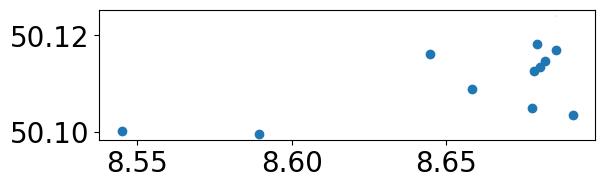

In [88]:
cinema.plot()

In [89]:
# find cinema counts in the grid
masks_cinema = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = cinema.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_cinema.append(pip_mask)

#cinema counts to the dataframe
cinema_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    cinema_count.append(cinema[masks_cinema[i]].shape[0])

100%|██████████| 1157/1157 [00:00<00:00, 1851.02it/s]


##### Townhall

In [90]:
townhall = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "townhall"},
)
townhall.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-townhall.csv")
townhall.head()

amenity                             name name:en  \
element_type osmid                                                           
node         34223060    townhall                            Römer   Römer   
             1051416002  townhall                  Rathaus Harheim     NaN   
             1469025823  townhall         Bürgeramt Niedereschbach     NaN   
             1493460749  townhall       Bürgeramt Nieder-Erlenbach     NaN   
             2107773404  townhall  Jugend und Sozialrathaus Höchst     NaN   

                        name:ru name:zh      opening_hours toilets:wheelchair  \
element_type osmid                                                              
node         34223060     Römer    老市政厅  Mo-Su 10:30-12:30                yes   
             1051416002     NaN     NaN                NaN                NaN   
             1469025823     NaN     NaN                NaN                NaN   
             1493460749     NaN     NaN                NaN                NaN   
             2107773404     NaN     NaN                NaN                NaN   

                            tourism wheelchair  \
element_type osmid                               
node         34223060    attraction        yes   
             1051416002         NaN        NaN   
             1469025823         NaN         no   
             1493460749         NaN        NaN   
             2107773404         NaN        NaN   

                                                    wheelchair:description  \
element_type osmid                                                           
node         34223060    Seiteneingang gegebnüber Paulskirche. An der P...   
             1051416002                                                NaN   
             1469025823                                                NaN   
             1493460749                                                NaN   
             2107773404                                                NaN   

                         ... addr:postcode addr:street email operator phone  \
element_type osmid       ...                                                  
node         34223060    ...           NaN         NaN   NaN      NaN   NaN   
             1051416002  ...           NaN         NaN   NaN      NaN   NaN   
             1469025823  ...           NaN         NaN   NaN      NaN   NaN   
             1493460749  ...           NaN         NaN   NaN      NaN   NaN   
             2107773404  ...           NaN         NaN   NaN      NaN   NaN   

                        townhall:type nodes addr:country building office  
element_type osmid                                                        
node         34223060             NaN   NaN          NaN      NaN    NaN  
             1051416002           NaN   NaN          NaN      NaN    NaN  
             1469025823           NaN   NaN          NaN      NaN    NaN  
             1493460749           NaN   NaN          NaN      NaN    NaN  
             2107773404           NaN   NaN          NaN      NaN    NaN  

[5 rows x 26 columns]

<Axes: >

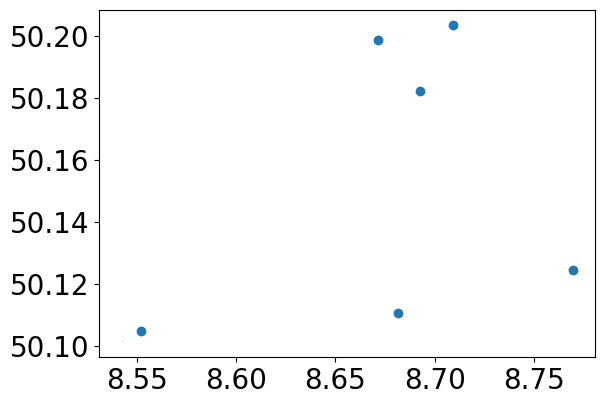

In [91]:
townhall.plot()

In [92]:
# find townhall counts in the grid
masks_townhall = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = townhall.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_townhall.append(pip_mask)

#townhall counts to the dataframe
townhall_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    townhall_count.append(townhall[masks_townhall[i]].shape[0])

berlin_polyframe_lat_long_new['townhall_count'] = townhall_count


100%|██████████| 1157/1157 [00:00<00:00, 1875.98it/s]


##### Community_centre

In [93]:
Community_centre = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "community_centre"},
)
Community_centre.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-Community_centre.csv")
Community_centre.head()

addr:city addr:country addr:housenumber  \
element_type osmid                                                        
node         330924083  Frankfurt am Main           DE              534   
             418698021  Frankfurt am Main          NaN              4-6   
             425855731                NaN          NaN              NaN   
             425880118  Frankfurt am Main          NaN              47a   
             767384244                NaN          NaN              NaN   

                       addr:postcode               addr:street  \
element_type osmid                                               
node         330924083         60433  Eschersheimer Landstraße   
             418698021         60439  Heddernheimer Landstraße   
             425855731           NaN                       NaN   
             425880118         60439  Heddernheimer Landstraße   
             767384244           NaN                       NaN   

                                 amenity                              email  \
element_type osmid                                                            
node         330924083  community_centre  maedchentreff@fem-maedchenhaus.de   
             418698021  community_centre                                NaN   
             425855731  community_centre                                NaN   
             425880118  community_centre                                NaN   
             767384244  community_centre                                NaN   

                                                                   name  \
element_type osmid                                                        
node         330924083                        FeM Mädchenhaus Frankfurt   
             418698021                          Jugendladen Heddernheim   
             425855731        Evangelisches Gemeindehaus Thomasgemeinde   
             425880118  Katholisches Gemeindezentrum St. Peter und Paul   
             767384244         Internationaler Bund Nachbarschaftstreff   

                                          name:de                     name:en  \
element_type osmid                                                              
node         330924083  FeM Mädchenhaus Frankfurt  FeM Girls' House Frankfurt   
             418698021                        NaN                         NaN   
             425855731                        NaN                         NaN   
             425880118                        NaN                         NaN   
             767384244                        NaN                         NaN   

                        ... club check_date  ref wikidata wikimedia_commons  \
element_type osmid      ...                                                   
node         330924083  ...  NaN        NaN  NaN      NaN               NaN   
             418698021  ...  NaN        NaN  NaN      NaN               NaN   
             425855731  ...  NaN        NaN  NaN      NaN               NaN   
             425880118  ...  NaN        NaN  NaN      NaN               NaN   
             767384244  ...  NaN        NaN  NaN      NaN               NaN   

                       wikipedia denomination religion ways type  
element_type osmid                                                
node         330924083       NaN          NaN      NaN  NaN  NaN  
             418698021       NaN          NaN      NaN  NaN  NaN  
             425855731       NaN          NaN      NaN  NaN  NaN  
             425880118       NaN          NaN      NaN  NaN  NaN  
             767384244       NaN          NaN      NaN  NaN  NaN  

[5 rows x 56 columns]

In [94]:
# find Community_centre counts in the grid
masks_Community_centre = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = Community_centre.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_Community_centre.append(pip_mask)

#Community_centre counts to the dataframe
Community_centre_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    Community_centre_count.append(Community_centre[masks_Community_centre[i]].shape[0])

100%|██████████| 1157/1157 [00:00<00:00, 1812.67it/s]


In [95]:
berlin_polyframe_lat_long_new['Community_centre_count'] = Community_centre_count

##### Building = Geovenment 

In [96]:
government = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "government"},
)

government.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-government_building.csv")
government.head()

geometry  \
element_type osmid                                                         
way          24021415  POLYGON ((8.66009 50.10291, 8.66013 50.10294, ...   
             24350078  POLYGON ((8.68786 50.11644, 8.68787 50.11632, ...   
             29496781  POLYGON ((8.65271 50.12334, 8.65277 50.12325, ...   
             29496782  POLYGON ((8.65268 50.12303, 8.65262 50.12314, ...   
             29496783  POLYGON ((8.65297 50.12293, 8.65302 50.12283, ...   

                               addr:city addr:country addr:housenumber  \
element_type osmid                                                       
way          24021415  Frankfurt am Main          NaN              126   
             24350078                NaN          NaN              NaN   
             29496781  Frankfurt am Main           DE               35   
             29496782  Frankfurt am Main           DE               33   
             29496783  Frankfurt am Main           DE               29   

                      addr:postcode    addr:street               name  \
element_type osmid                                                      
way          24021415         60327  Gutleutstraße                NaN   
             24350078           NaN            NaN  Gerichtsgebäude C   
             29496781         60325  Zeppelinallee                NaN   
             29496782         60325  Zeppelinallee                NaN   
             29496783         60325  Zeppelinallee                NaN   

                                                                   nodes  \
element_type osmid                                                         
way          24021415  [2389908526, 7329141355, 6266703615, 260494091...   
             24350078  [264150780, 842540395, 842540430, 264150781, 1...   
             29496781  [360768895, 325145953, 360768898, 2515358730, ...   
             29496782  [325145971, 325145973, 325145974, 325145972, 3...   
             29496783  [2515358697, 325145975, 325145980, 325145981, ...   

                         building wheelchair  ... office opening_hours:signed  \
element_type osmid                            ...                               
way          24021415  government        NaN  ...    NaN                  NaN   
             24350078  government        NaN  ...    NaN                  NaN   
             29496781  government        NaN  ...    NaN                  NaN   
             29496782  government        NaN  ...    NaN                  NaN   
             29496783  government        NaN  ...    NaN                  NaN   

                      target building:levels building:min_level layer  \
element_type osmid                                                      
way          24021415    NaN             NaN                NaN   NaN   
             24350078    NaN             NaN                NaN   NaN   
             29496781    NaN             NaN                NaN   NaN   
             29496782    NaN             NaN                NaN   NaN   
             29496783    NaN             NaN                NaN   NaN   

                      note:building:min_level source ways type  
element_type osmid                                              
way          24021415                     NaN    NaN  NaN  NaN  
             24350078                     NaN    NaN  NaN  NaN  
             29496781                     NaN    NaN  NaN  NaN  
             29496782                     NaN    NaN  NaN  NaN  
             29496783                     NaN    NaN  NaN  NaN  

[5 rows x 24 columns]

<Axes: >

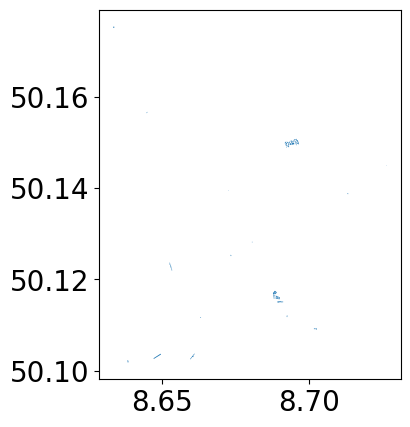

In [97]:
government.plot()

In [98]:
# find government counts in the grid
masks_government = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = government.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_government.append(pip_mask)

#government counts to the dataframe
government_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    government_count.append(government[masks_government[i]].shape[0])

berlin_polyframe_lat_long_new['government_count'] = government_count


100%|██████████| 1157/1157 [00:00<00:00, 1913.06it/s]


##### Building=civic 

In [99]:
civic = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "civic"},
)

civic.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-civic_building.csv")
civic.head()

addr:city addr:housenumber addr:postcode  \
element_type osmid                                                        
way          28673946  Frankfurt am Main               16         60431   
             29040274                NaN              NaN           NaN   
             29054054                NaN              NaN           NaN   
             29981539  Frankfurt am Main               29         60486   
             30119021  Frankfurt am Main               25         60325   

                               addr:street  \
element_type osmid                           
way          28673946  Stefan-Zweig-Straße   
             29040274                  NaN   
             29054054                  NaN   
             29981539         Schloßstraße   
             30119021    Senckenberganlage   

                                                                geometry  \
element_type osmid                                                         
way          28673946  POLYGON ((8.65572 50.14250, 8.65576 50.14261, ...   
             29040274  POLYGON ((8.65821 50.15598, 8.65830 50.15590, ...   
             29054054  POLYGON ((8.64567 50.14999, 8.64552 50.15003, ...   
             29981539  POLYGON ((8.63954 50.12237, 8.63947 50.12233, ...   
             30119021  POLYGON ((8.65109 50.11769, 8.65106 50.11746, ...   

                                                                   nodes  \
element_type osmid                                                         
way          28673946  [315109196, 315109199, 2030587742, 2030587741,...   
             29040274  [319403383, 319403385, 319403387, 319403389, 3...   
             29054054  [319570645, 319570647, 319570648, 319570646, 3...   
             29981539  [330048272, 330048275, 330048285, 3306282856, ...   
             30119021  [331891535, 331891521, 9825792481, 9825792480,...   

                      layer building addr:country building:levels  ... office  \
element_type osmid                                                 ...          
way          28673946   NaN    civic          NaN             NaN  ...    NaN   
             29040274   NaN    civic          NaN             NaN  ...    NaN   
             29054054   NaN    civic          NaN             NaN  ...    NaN   
             29981539   NaN    civic           DE               4  ...    NaN   
             30119021   NaN    civic           DE               5  ...    NaN   

                      roof:colour roof:material roof:levels ways  \
element_type osmid                                                 
way          28673946         NaN           NaN         NaN  NaN   
             29040274         NaN           NaN         NaN  NaN   
             29054054         NaN           NaN         NaN  NaN   
             29981539         NaN           NaN         NaN  NaN   
             30119021         NaN           NaN         NaN  NaN   

                      contact:email contact:fax contact:phone police type  
element_type osmid                                                         
way          28673946           NaN         NaN           NaN    NaN  NaN  
             29040274           NaN         NaN           NaN    NaN  NaN  
             29054054           NaN         NaN           NaN    NaN  NaN  
             29981539           NaN         NaN           NaN    NaN  NaN  
             30119021           NaN         NaN           NaN    NaN  NaN  

[5 rows x 52 columns]

<Axes: >

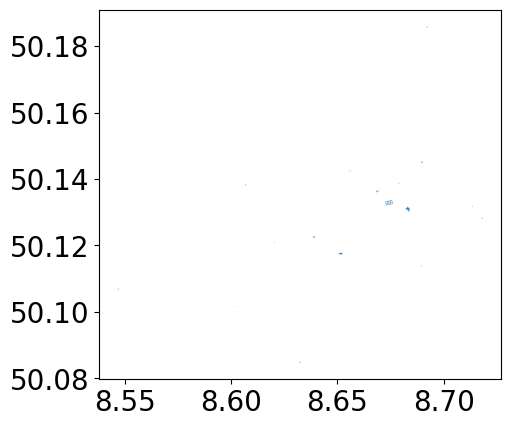

In [100]:
civic.plot()

In [101]:
# find civic counts in the grid
masks_civic = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = civic.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_civic.append(pip_mask)

#civic counts to the dataframe
civic_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    civic_count.append(civic[masks_civic[i]].shape[0])

berlin_polyframe_lat_long_new['civic_count'] = civic_count

100%|██████████| 1157/1157 [00:00<00:00, 1808.71it/s]


##### building=commercial

In [102]:
commercial = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "commercial"},
)
commercial.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-commercial_building.csv")
commercial.head()


geometry  \
element_type osmid                                                           
node         7526387969                           POINT (8.64793 50.10426)   
way          4742746     POLYGON ((8.56546 50.05182, 8.56476 50.05172, ...   
             11017083    POLYGON ((8.65390 50.11116, 8.65397 50.11123, ...   
             11017114    POLYGON ((8.65482 50.11070, 8.65474 50.11062, ...   
             11017234    POLYGON ((8.64927 50.11239, 8.64931 50.11241, ...   

                           amenity brothel:eros_center  \
element_type osmid                                       
node         7526387969  fast_food                 NaN   
way          4742746           NaN                 NaN   
             11017083          NaN                 NaN   
             11017114          NaN                 NaN   
             11017234          NaN                 NaN   

                                            name  ref toilets:wheelchair  \
element_type osmid                                                         
node         7526387969                SnaQ Boxx  NaN                NaN   
way          4742746                 The Squaire  NaN                NaN   
             11017083                     Kastor  NaN                NaN   
             11017114                     Pollux  NaN                NaN   
             11017234    Maritim Hotel Frankfurt  NaN                NaN   

                                 addr:city addr:housenumber addr:postcode  \
element_type osmid                                                          
node         7526387969                NaN              NaN           NaN   
way          4742746     Frankfurt am Main              NaN         60549   
             11017083    Frankfurt am Main                1         60327   
             11017114    Frankfurt am Main                2         60327   
             11017234    Frankfurt am Main                3         60486   

                                 addr:street  ... building:min_level  \
element_type osmid                            ...                      
node         7526387969                  NaN  ...                NaN   
way          4742746                     NaN  ...                NaN   
             11017083      Platz der Einheit  ...                NaN   
             11017114      Platz der Einheit  ...                NaN   
             11017234    Theodor-Heuss-Allee  ...                NaN   

                        noaddress check_date disused:shop source:outline  \
element_type osmid                                                         
node         7526387969       NaN        NaN          NaN            NaN   
way          4742746          NaN        NaN          NaN            NaN   
             11017083         NaN        NaN          NaN            NaN   
             11017114         NaN        NaN          NaN            NaN   
             11017234         NaN        NaN          NaN            NaN   

                        craft type ways addr:suburb defibrillator:location  
element_type osmid                                                          
node         7526387969   NaN  NaN  NaN         NaN                    NaN  
way          4742746      NaN  NaN  NaN         NaN                    NaN  
             11017083     NaN  NaN  NaN         NaN                    NaN  
             11017114     NaN  NaN  NaN         NaN                    NaN  
             11017234     NaN  NaN  NaN         NaN                    NaN  

[5 rows x 116 columns]

<Axes: >

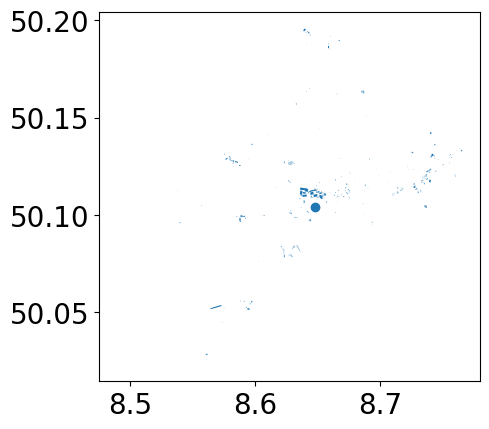

In [103]:
commercial.plot()

In [104]:
# find commercial counts in the grid
masks_commercial = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = commercial.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_commercial.append(pip_mask)

#commercial counts to the dataframe
commercial_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    commercial_count.append(commercial[masks_commercial[i]].shape[0])

berlin_polyframe_lat_long_new['commercial_count'] = commercial_count


100%|██████████| 1157/1157 [00:00<00:00, 1700.46it/s]


##### building = Retail stores

In [105]:
retail = ox.geometries_from_place(
    PLACE_NAME,
    {"building": "retail"},
)
retail.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-retail_building.csv")
retail.head()

amenity  \
element_type osmid                 
way          15458735        NaN   
             23248294        NaN   
             25480076        NaN   
             25538793        NaN   
             26201442  fast_food   

                                                                geometry  \
element_type osmid                                                         
way          15458735  POLYGON ((8.60062 50.13668, 8.60053 50.13669, ...   
             23248294  POLYGON ((8.69938 50.11622, 8.69950 50.11622, ...   
             25480076  POLYGON ((8.60618 50.12830, 8.60623 50.12831, ...   
             25538793  POLYGON ((8.60703 50.09457, 8.60703 50.09475, ...   
             26201442  POLYGON ((8.57614 50.13248, 8.57621 50.13241, ...   

                      wheelchair access  \
element_type osmid                        
way          15458735        yes    NaN   
             23248294        NaN    NaN   
             25480076    limited    NaN   
             25538793        NaN    NaN   
             26201442    limited    NaN   

                                             wheelchair:description operator  \
element_type osmid                                                             
way          15458735  alles ebenerdig, mit behindertengerechtem WC      NaN   
             23248294                                           NaN      NaN   
             25480076                                           NaN      NaN   
             25538793                                           NaN      NaN   
             26201442                                           NaN      NaN   

                               addr:city addr:country addr:housenumber  \
element_type osmid                                                       
way          15458735  Frankfurt am Main           DE               10   
             23248294                NaN          NaN              NaN   
             25480076  Frankfurt am Main           DE               41   
             25538793  Frankfurt am Main          NaN               1b   
             26201442                NaN          NaN               13   

                      addr:postcode  ... breakfast drive_through ice_cream  \
element_type osmid                   ...                                     
way          15458735         60488  ...       NaN           NaN       NaN   
             23248294           NaN  ...       NaN           NaN       NaN   
             25480076         60489  ...       NaN           NaN       NaN   
             25538793         65933  ...       NaN           NaN       NaN   
             26201442           NaN  ...       NaN           NaN       NaN   

                      indoor_seating leisure note addr:housename noname ways  \
element_type osmid                                                             
way          15458735            NaN     NaN  NaN            NaN    NaN  NaN   
             23248294            NaN     NaN  NaN            NaN    NaN  NaN   
             25480076            NaN     NaN  NaN            NaN    NaN  NaN   
             25538793            NaN     NaN  NaN            NaN    NaN  NaN   
             26201442            NaN     NaN  NaN            NaN    NaN  NaN   

                      type  
element_type osmid          
way          15458735  NaN  
             23248294  NaN  
             25480076  NaN  
             25538793  NaN  
             26201442  NaN  

[5 rows x 129 columns]

<Axes: >

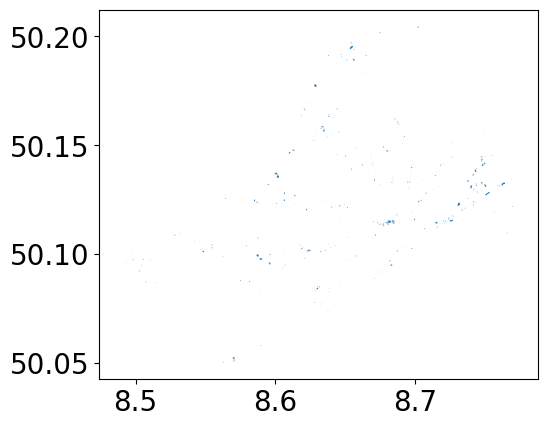

In [106]:
retail.plot()

In [107]:
# find retail counts in the grid
masks_retail = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = retail.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_retail.append(pip_mask)

#retail counts to the dataframe
retail_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    retail_count.append(retail[masks_retail[i]].shape[0])

berlin_polyframe_lat_long_new['retail_count'] = retail_count

100%|██████████| 1157/1157 [00:00<00:00, 1589.89it/s]


##### amenity=place_of_worship

In [108]:
place_of_worship = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "place_of_worship"},
)
place_of_worship.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/raw/{name}-place_of_worship.csv")
place_of_worship.head()

amenity denomination                   name  \
element_type osmid                                                            
node         29909948  place_of_worship     catholic         Sancta Familia   
             29910640  place_of_worship     lutheran        Bethlehemkirche   
             30056443  place_of_worship     catholic        Sankt Sebastian   
             30762764  place_of_worship  evangelical  Kirche des Nazareners   
             30764007  place_of_worship   protestant        Dornbuschkirche   

                        religion wheelchair                  geometry  \
element_type osmid                                                      
node         29909948  christian         no  POINT (8.65392 50.14309)   
             29910640  christian        NaN  POINT (8.65296 50.14546)   
             30056443  christian        NaN  POINT (8.63486 50.15474)   
             30762764  christian        NaN  POINT (8.66318 50.14712)   
             30764007  christian        yes  POINT (8.67339 50.14045)   

                               addr:city addr:housenumber addr:postcode  \
element_type osmid                                                        
node         29909948                NaN              NaN           NaN   
             29910640  Frankfurt am Main                1         60431   
             30056443                NaN              NaN           NaN   
             30762764                NaN              NaN           NaN   
             30764007  Frankfurt am Main                1         60320   

                                 addr:street  ... contact:email long_name  \
element_type osmid                            ...                           
node         29909948                    NaN  ...           NaN       NaN   
             29910640              Fuchshohl  ...           NaN       NaN   
             30056443                    NaN  ...           NaN       NaN   
             30762764                    NaN  ...           NaN       NaN   
             30764007  Carl-Goerdeler-Straße  ...           NaN       NaN   

                      height source:height roof:height ways type  \
element_type osmid                                                 
node         29909948    NaN           NaN         NaN  NaN  NaN   
             29910640    NaN           NaN         NaN  NaN  NaN   
             30056443    NaN           NaN         NaN  NaN  NaN   
             30762764    NaN           NaN         NaN  NaN  NaN   
             30764007    NaN           NaN         NaN  NaN  NaN   

                      addr:street:en alt_name:ur name:ur  
element_type osmid                                        
node         29909948            NaN         NaN     NaN  
             29910640            NaN         NaN     NaN  
             30056443            NaN         NaN     NaN  
             30762764            NaN         NaN     NaN  
             30764007            NaN         NaN     NaN  

[5 rows x 82 columns]

<Axes: >

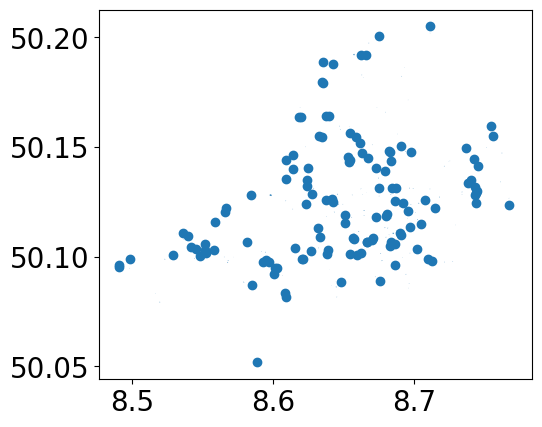

In [109]:
place_of_worship.plot()

In [110]:
# find place_of_worship counts in the grid
masks_place_of_worship = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    pip_mask = place_of_worship.within(city_polyframe_lat_long.loc[i, 'geometry']) 
    masks_place_of_worship.append(pip_mask)

#place_of_worship counts to the dataframe
place_of_worship_count = []
for i in tqdm(range(0,city_polyframe_lat_long.shape[0])):
    place_of_worship_count.append(place_of_worship[masks_place_of_worship[i]].shape[0])

berlin_polyframe_lat_long_new['place_of_worship_count'] = place_of_worship_count


100%|██████████| 1157/1157 [00:00<00:00, 1786.46it/s]


#### Detailed CSV SAVE

In [111]:
# save the dataframe
berlin_polyframe_lat_long_new.to_csv(f"/home/akansh-i2sc/Desktop/ds_project/Repo/data-science-Optimal-EV-station-placement/data/processed/{name}_data_detailed.csv")